**The flow of the Notebook:**

1. Description of the Problem Statement.

2. Car Damage Detection Dataset Loading.

3. Check The Dataset.

4. Split The Dataset in Train, Test and Validation Set.

5. Apply Data Augmentation.

6. Hyper Parameter Tuning, and verification for improving the performance.

7. Training the Model. (AlexNet Model Implementation using Tensorflow Functional API)

8. Save the trained model.

9. Visualize Tensorboard.

10. Check Performance of the Model.

11. Model Evaluation (Confusion Matrix, Classification Report, TP,FP,TN,FN,Precision, Recall and F1-Score, Precision-Recall Curve,ROC and AUC Curve).

12. Convert Tensorflow model into ONNX format and TF Lite format Then compare the compressed models file size, Inference Time and Accuracy.(model inference lightening and speeding for implementation on Edge Device)

13. Apply Basic FastAPI Technique.

14. MLOps: Apply Basic MLFlow Technique for model tracking.  


**Problem Statement:**

As we all know we are very close to getting the Autonomous Vehicles on road and for that Traffic Sign Classification is an essential part.

It is essential so that the autonomous vehicle can understand the traffic signs properly and take actions accordingly.

**Import Libraries**

In [1]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import TensorBoard, EarlyStopping,LearningRateScheduler,CSVLogger, ModelCheckpoint, LearningRateScheduler
from sklearn.metrics import confusion_matrix ,classification_report
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.metrics import roc_curve, auc
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os

**DEFINE IMAGE SIZE, BATCH SIZE and NUMBER OF CHNNELS**

In [2]:
IMAGE_SIZE = 128
BATCH_SIZE = 32
CHANNELS = 3

**Traffic Sign Classification Data Set Loading**

In [3]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "/content/traffic/myData",
    seed=123,
    shuffle=True,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size=BATCH_SIZE,
    #color_mode = "grayscale"
)

Found 2000 files belonging to 20 classes.


**SHOW THE CLASS NAMES**

In [4]:
class_names = dataset.class_names
class_names

['0',
 '1',
 '10',
 '11',
 '12',
 '13',
 '14',
 '15',
 '16',
 '17',
 '18',
 '19',
 '2',
 '3',
 '4',
 '5',
 '6',
 '7',
 '8',
 '9']

**CHECK THE BATCH SIZE, IMAGE SIZE , NUMBER OF CHANNELS and LABELS**

In [5]:
for image_batch, labels_batch in dataset.take(1):
    print(image_batch.shape)
    print(labels_batch.numpy())

(32, 128, 128, 3)
[17 11 18 15 13 19 11  2 16  5  7  8  8 13  3  2 19 13  5 14  3 15  6 11
  5 10 17 19  7 11  4 17]


**CHECK THE IMAGE DATA**

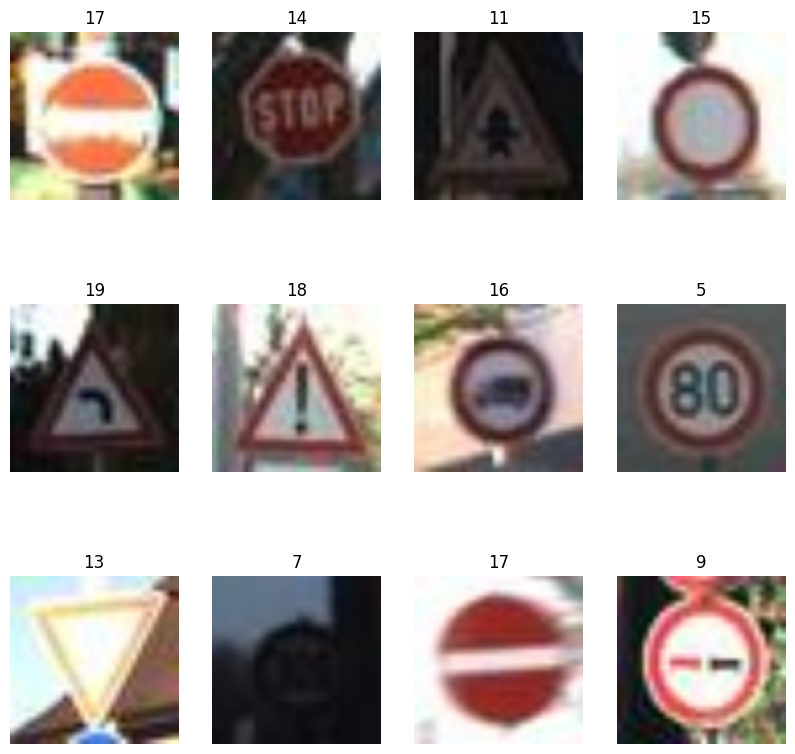

In [6]:
plt.figure(figsize=(10, 10))
for image_batch, labels_batch in dataset.take(1):
    for i in range(12):
        ax = plt.subplot(3, 4, i + 1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[labels_batch[i]])
        plt.axis("off")

**SPLIT THE DATA SET INTO TRAIN, VALIDATION and TEST**

In [7]:
def get_dataset_partitions(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=900):
    assert (train_split + test_split + val_split) == 1

    ds_size = len(ds)

    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=12)

    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)

    train_ds = ds.take(train_size)
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)

    return train_ds, val_ds, test_ds



In [8]:
train_ds, val_ds, test_ds = get_dataset_partitions(dataset)

In [75]:
len(train_ds)

50

In [76]:
len(val_ds)

6

In [77]:
len(test_ds)

7

**Apply DATA AUGMENTATION**

In [9]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Create an instance of ImageDataGenerator for data augmentation
data_augmentation = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    #rescale=1.0 / 255  # Rescale pixel values to [0, 1]
)

# Extract images and labels from the training dataset
train_images = []
train_labels = []
for images_batch, labels_batch in train_ds:
    train_images.append(images_batch.numpy())
    train_labels.append(labels_batch.numpy())
train_images = np.concatenate(train_images)
train_labels = np.concatenate(train_labels)

# Apply data augmentation to the training dataset
augmented_train_ds = data_augmentation.flow(
    x=train_images,
    y=train_labels,  # You need to specify the labels as well
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=123
)

# Apply rescaling to the validation and test datasets
#val_ds = val_ds.map(lambda x, y: (x / 255, y))
#test_ds = test_ds.map(lambda x, y: (x / 255, y))

**Apply rescaling to the Train, validation and test datasets**

In [ ]:
train_ds = train_ds.map(lambda x, y: (x / 255, y))
val_ds = val_ds.map(lambda x, y: (x / 255, y))
test_ds = test_ds.map(lambda x, y: (x / 255, y))

**APPLY CACHE and PREFETCH FOR SPEEDING UP DATA PROCESSING PIPELINE**

In [10]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

**DEFINE THE NUMBER OF CLASS**

In [11]:
number_of_class = len(class_names)
print(number_of_class)

20


**AlexNet Model Architecture**

In [12]:
def AlexNet(input_shape, number_of_class,activation):
  input_layer = tf.keras.Input(shape=input_shape)

#Convolutional Layer 1
  conv_1 = layers.Conv2D(filters=96,kernel_size=(11,11),strides=(4,4),activation='relu')(input_layer)
  max_pool_1 = layers.MaxPooling2D(pool_size=(3,3),strides=(2,2))(conv_1)
  bn_1 =layers.BatchNormalization()(max_pool_1)

#Convolutional Layer 2
  conv_2 = layers.Conv2D(filters=256,kernel_size=(5,5),activation='relu',padding='same')(bn_1)
  max_pool_2 = layers.MaxPooling2D(pool_size=(3,3),strides=(2,2))(conv_2)
  bn_2 = layers.BatchNormalization()(max_pool_2)

#Convolutional Layer 3
  conv_3 = layers.Conv2D(filters=384,kernel_size=(3,3),activation='relu',padding='same')(bn_2)

#Convolutional Layer 4
  conv_4 = layers.Conv2D(filters=384,kernel_size=(3,3),activation='relu',padding='same')(conv_3)

#Convolutional Layer 5
  conv_5 = layers.Conv2D(filters=384,kernel_size=(3,3),activation='relu',padding='same')(conv_4)

# Last pooling layer
  max_pool_3 = layers.MaxPooling2D(pool_size=(3,3),strides=(2,2))(conv_5)

#Flatten layer
  flatten = layers.Flatten()(max_pool_3)

#Fully Connected Layer 1
  fc_1 = layers.Dense(units=4096,activation='relu')(flatten)
  drop_out_1 = layers.Dropout(0.5)(fc_1)

#Fully Connected Layer 2
  fc_2 = layers.Dense(units=4096,activation='relu')(drop_out_1)
  drop_out_2 = layers.Dropout(0.5)(fc_2)

#Fully Connected Layer 3
  fc_3 = layers.Dense(units=4096,activation='relu')(drop_out_2)
  drop_out_3 = layers.Dropout(0.5)(fc_3)

# Output Layer
  output_layer = layers.Dense(units=number_of_class,activation=activation)(drop_out_3)

#Create the model
  model = models.Model(inputs=input_layer,outputs=output_layer)

  return model
input_shape = (IMAGE_SIZE,IMAGE_SIZE,CHANNELS)
number_of_class = number_of_class
activation='softmax'
alex_net_model = AlexNet(input_shape,number_of_class,activation)

alex_net_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 30, 30, 96)        34944     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 96)       0         
 )                                                               
                                                                 
 batch_normalization (BatchN  (None, 14, 14, 96)       384       
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 14, 256)       614656    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 6, 6, 256)        0     

**COMPILE THE AlexNet MODEL**

In [13]:
alex_net_model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

**DEFINE AlexNet LOG DIRECTORY**

In [14]:
log_dir='logs_AlexNet'

**Define Learning Rate Scheduler Callback**

In [15]:
# Define the learning rate schedule using a cosine annealing function
def cosine_annealing(epoch, lr):
    max_epochs = 10  # Total number of epochs
    max_lr = 0.01  # Maximum learning rate
    min_lr = 0.001  # Minimum learning rate

    # Apply cosine annealing formula
    lr = min_lr + 0.5 * (max_lr - min_lr) * (1 + tf.math.cos(epoch / max_epochs * np.pi))
    return lr

lr_scheduler_callback = LearningRateScheduler(cosine_annealing)

**DEFINE EARLY STOPPING CALL BACK**

In [16]:
early_stopping = EarlyStopping(
    monitor='val_accuracy',  # Monitor validation accuracy
    patience=3,  # Stop training if validation loss doesn't improve for 3 epochs
    restore_best_weights=True  # Restore model weights from the epoch with the best validation loss
)

**DEFINE CSV LOGGER CALL BACK**

In [17]:
csv_logger = CSVLogger(
    filename=log_dir + '/training_log.csv',  # Specify the CSV file path
    separator=',',  # Separator used in the CSV file
    append=False  # Append to the existing file if it exists
)

**DEFINE CHECK POINT CALL BACK**

In [18]:
# Create the ModelCheckpoint callback
checkpoint_path = log_dir + '/best_alexnet_model.h5'
checkpoint_callback = ModelCheckpoint(
    checkpoint_path,
    monitor="val_accuracy",  # Choose the metric to monitor for saving the best model
    save_best_only=True,
    mode="max",  # Choose "max" if your metric should be maximized, "min" if minimized
    verbose=1
)

**DEFINE TENSORBOARD CALL BACK**

In [19]:
# Define the TensorBoard callback
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

**AlexNet MODEL TRAINING**

In [20]:
EPOCHS = 10
alexNet_history = alex_net_model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=EPOCHS,
    callbacks=[lr_scheduler_callback,early_stopping,csv_logger,checkpoint_callback,tensorboard_callback]
)

Epoch 1/10
50/50 [==============================] - ETA: 0s - loss: 5071.4575 - accuracy: 0.0518
Epoch 1: val_accuracy improved from -inf to 0.05208, saving model to logs_AlexNet/best_alexnet_model.h5
50/50 [==============================] - 168s 3s/step - loss: 5071.4575 - accuracy: 0.0518 - val_loss: 3.0170 - val_accuracy: 0.0521 - lr: 0.0100
Epoch 2/10
50/50 [==============================] - ETA: 0s - loss: 3.0141 - accuracy: 0.0511
Epoch 2: val_accuracy improved from 0.05208 to 0.06250, saving model to logs_AlexNet/best_alexnet_model.h5
50/50 [==============================] - 146s 3s/step - loss: 3.0141 - accuracy: 0.0511 - val_loss: 3.0109 - val_accuracy: 0.0625 - lr: 0.0098
Epoch 3/10
50/50 [==============================] - ETA: 0s - loss: 3.0076 - accuracy: 0.0568
Epoch 3: val_accuracy did not improve from 0.06250
50/50 [==============================] - 146s 3s/step - loss: 3.0076 - accuracy: 0.0568 - val_loss: 3.0045 - val_accuracy: 0.0521 - lr: 0.0091
Epoch 4/10
50/50 [===

**SAVE AlexNet MODEL**

In [21]:
# Define a path to save the model
model_save_path = "/content/models/AlexNet"

# Save the model
alex_net_model.save(model_save_path)

print("Model saved at:", model_save_path)

Model saved at: /content/models/AlexNet


**TENSORBOARD DASBOARD**

In [22]:
%load_ext tensorboard
%tensorboard --logdir logs_AlexNet

<IPython.core.display.Javascript object>

**EVALUATE AlexNet MODEL SCORE**

In [23]:
scores = alex_net_model.evaluate(test_ds)

7/7 [==============================] - 4s 389ms/step - loss: 2.9947 - accuracy: 0.0536


In [24]:
alexNet_history.params

{'verbose': 1, 'epochs': 10, 'steps': 50}

In [25]:
alexNet_history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])

**PLOAT ACCURACY and LOSS CURVE**

In [26]:
acc = alexNet_history.history['accuracy']
val_acc = alexNet_history.history['val_accuracy']

loss = alexNet_history.history['loss']
val_loss = alexNet_history.history['val_loss']

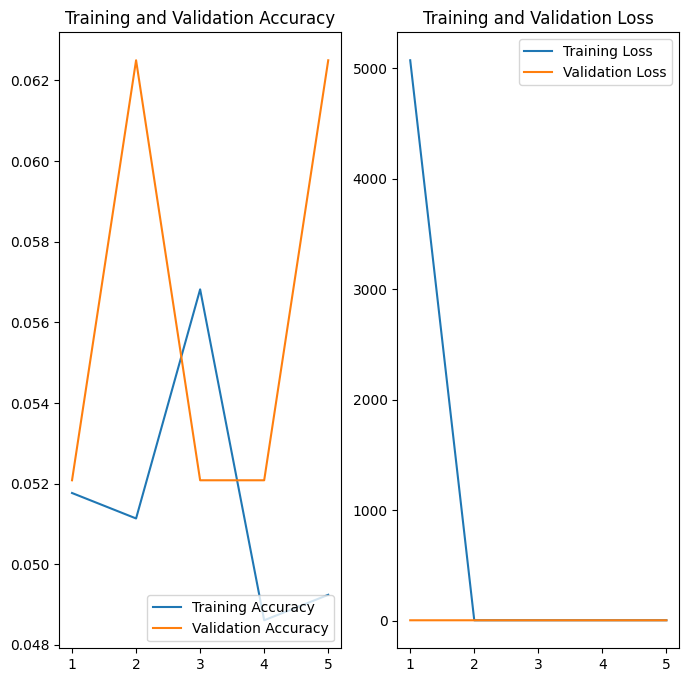

In [27]:
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(range(1, len(acc) + 1), acc, label='Training Accuracy')
plt.plot(range(1, len(val_acc) + 1), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(1, len(loss) + 1), loss, label='Training Loss')
plt.plot(range(1, len(val_loss) + 1), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

**SINGLE PREDICTION**

first image to predict
actual label: 7
1/1 [==============================] - 1s 588ms/step
predicted label: 9


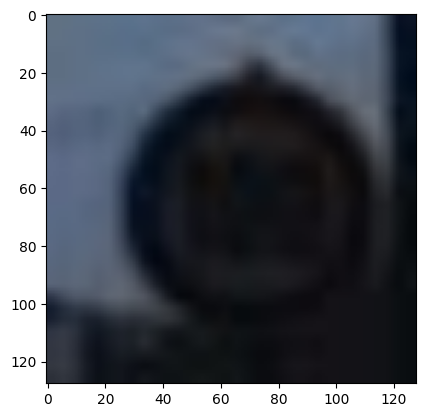

In [28]:
for images_batch, labels_batch in test_ds.take(1):

    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()

    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])

    batch_prediction_alexNet = alex_net_model.predict(images_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction_alexNet[0])])

**WRITE A FUNCTION FOR INFERENCE**

In [29]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = alex_net_model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

**RUN INFERENCE ON FEW TEST IMAGES**

1/1 [==============================] - 0s 52ms/step


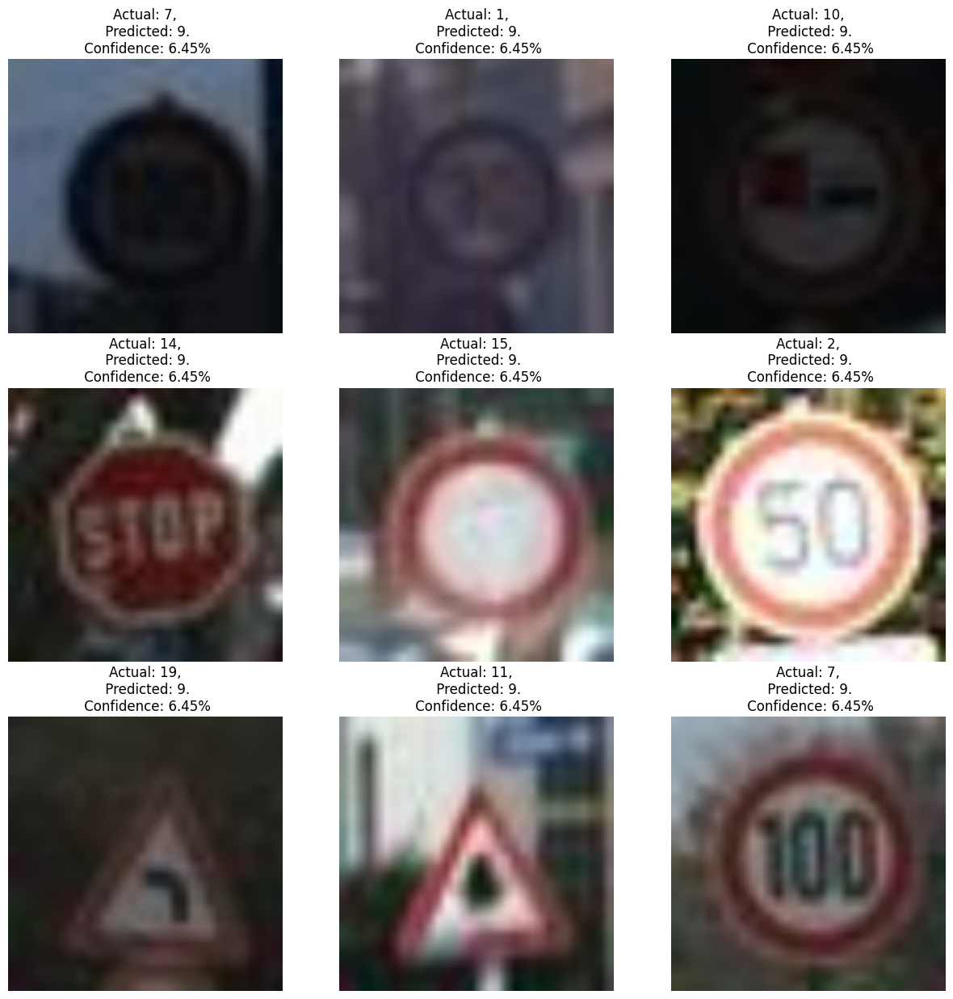

In [30]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))

        predicted_class, confidence = predict(alex_net_model, images[i].numpy())
        actual_class = class_names[labels[i]]

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")

        plt.axis("off")

**MODEL EVALUATION and VERIFICATION**

7/7 [==============================] - 3s 446ms/step


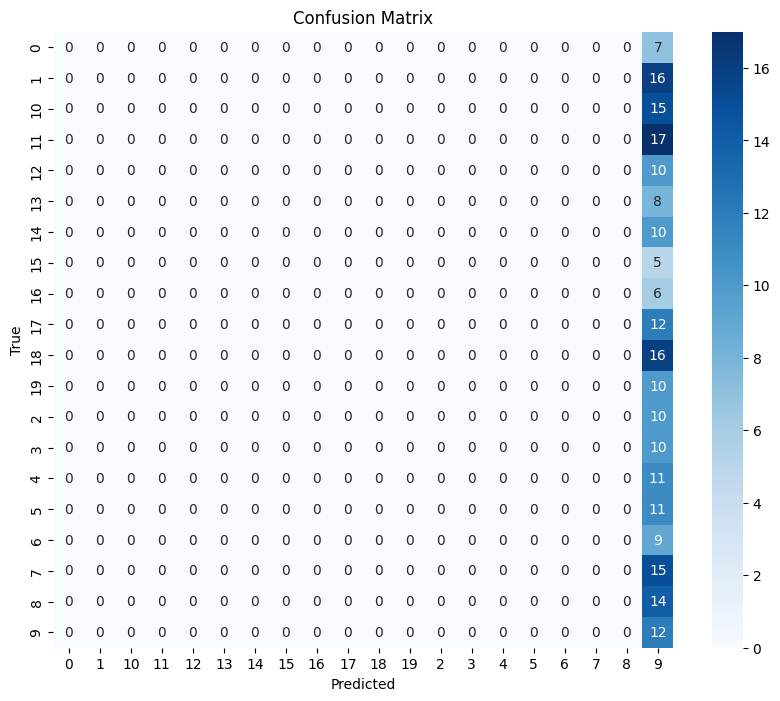

True Positives (TP): 0
False Positives (FP): 0
True Negatives (TN): 0
False Negatives (FN): 0
Recall (Sensitivity): nan
              precision    recall  f1-score   support

           0       1.00      0.00      0.00         7
           1       1.00      0.00      0.00        16
          10       1.00      0.00      0.00        15
          11       1.00      0.00      0.00        17
          12       1.00      0.00      0.00        10
          13       1.00      0.00      0.00         8
          14       1.00      0.00      0.00        10
          15       1.00      0.00      0.00         5
          16       1.00      0.00      0.00         6
          17       1.00      0.00      0.00        12
          18       1.00      0.00      0.00        16
          19       1.00      0.00      0.00        10
           2       1.00      0.00      0.00        10
           3       1.00      0.00      0.00        10
           4       1.00      0.00      0.00        11
           5   

<ipython-input-31-db03bfdf1b26>:33: RuntimeWarning: invalid value encountered in long_scalars
  recall = tp / (tp + fn)


In [31]:
# Generate predictions for the test dataset
test_images = []
test_labels = []
for images_batch, labels_batch in test_ds:
    test_images.extend(images_batch.numpy())
    test_labels.extend(labels_batch.numpy())

test_images = np.array(test_images)
test_labels = np.array(test_labels)

predictions = alex_net_model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)

# Compute confusion matrix
conf_matrix = confusion_matrix(test_labels, predicted_labels)

# Plot confusion matrix as heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


# Calculate TP, FP, TN, FN
tp = conf_matrix[1, 1]
fp = conf_matrix[0, 1]
tn = conf_matrix[0, 0]
fn = conf_matrix[1, 0]

# Calculate Recall (Sensitivity)
recall = tp / (tp + fn)

# Print the metrics
print("True Positives (TP):", tp)
print("False Positives (FP):", fp)
print("True Negatives (TN):", tn)
print("False Negatives (FN):", fn)
print("Recall (Sensitivity):", recall)

# Classification Report
class_report = classification_report(test_labels, predicted_labels, target_names=class_names,zero_division=1)
print(class_report)

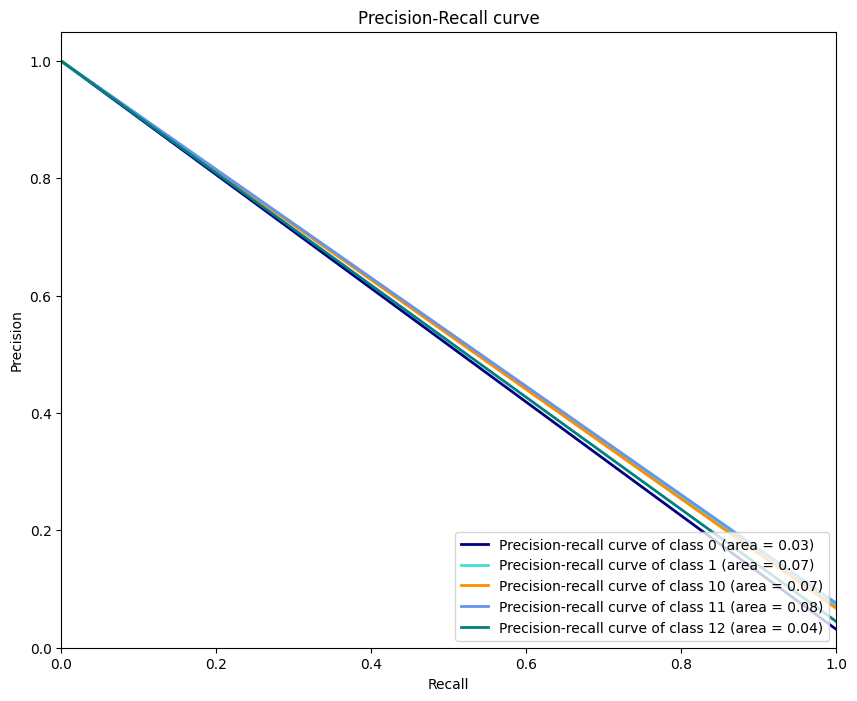

In [32]:
# Calculate precision-recall curves and average precision
precision = dict()
recall = dict()
average_precision = dict()
for i in range(number_of_class):
    precision[i], recall[i], _ = precision_recall_curve(test_labels == i, predictions[:, i])
    average_precision[i] = average_precision_score(test_labels == i, predictions[:, i])

# Plot precision-recall curves
plt.figure(figsize=(10, 8))
colors = ['navy', 'turquoise', 'darkorange', 'cornflowerblue', 'teal']
for i, color in zip(range(number_of_class), colors):
    plt.plot(recall[i], precision[i], color=color, lw=2,
             label='Precision-recall curve of class {0} (area = {1:0.2f})'
             ''.format(class_names[i], average_precision[i]))

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall curve')
plt.legend(loc="lower right")
plt.show()


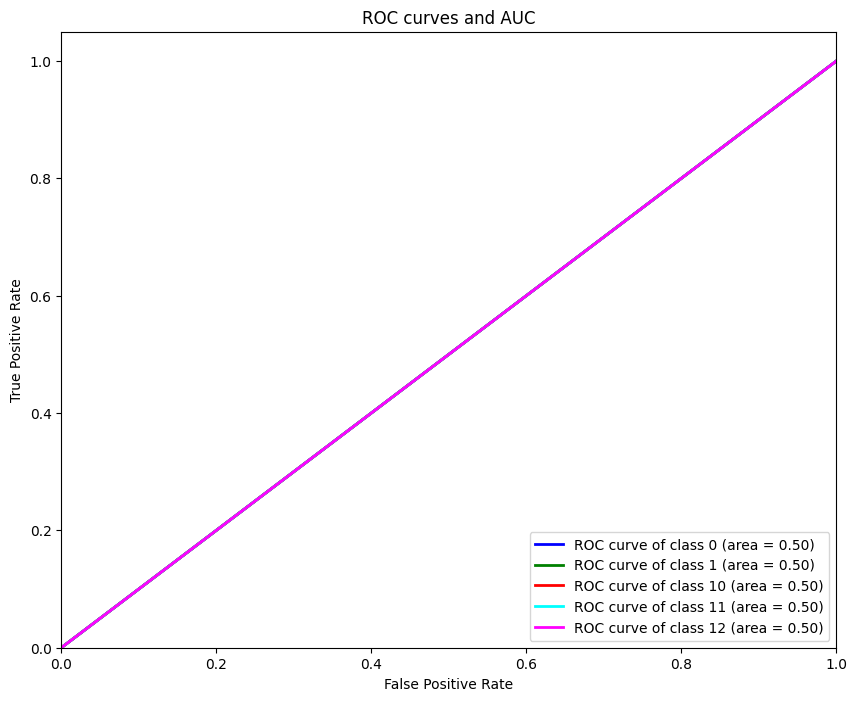

In [33]:
# Calculate ROC curves and AUC
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(number_of_class):
    fpr[i], tpr[i], _ = roc_curve(test_labels == i, predictions[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(10, 8))
colors = ['blue', 'green', 'red', 'cyan', 'magenta']
for i, color in zip(range(number_of_class), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(class_names[i], roc_auc[i]))

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curves and AUC')
plt.legend(loc="lower right")
plt.show()

**Convert Tensorflow model into ONNX format and TF Lite format Then compare the compressed models file size, Inference Time and Accuracy:(model inference lightening and speeding for implementation on Edge Device)**

In [34]:
!pip install tf2onnx
!pip install onnx
!pip install onnxruntime

Model File Sizes:
TensorFlow Model Size: 505.0563716888428 MB
TensorFlow Lite Model Size: 168.35105895996094 MB
ONNX Model Size: 168.35312366485596 MB
<<<<<<<<<<<=========================================>>>>>>>>>>>
1/1 [==============================] - 0s 291ms/step
Inference Times:
TensorFlow Inference Time: 0.3524894714355469 seconds
TensorFlow Lite Inference Time: 0.05046224594116211 seconds
ONNX Inference Time: 0.03148198127746582 seconds
<<<<<<<<<<<=========================================>>>>>>>>>>>
<<<<<<<<<<<=========================================>>>>>>>>>>>
Predicted Label and Confidence:
TensorFlow: 19  (Confidence: 6.45%)
TensorFlow Lite: 19  (Confidence: 6.45%)
ONNX: 19  (Confidence: 6.45%)


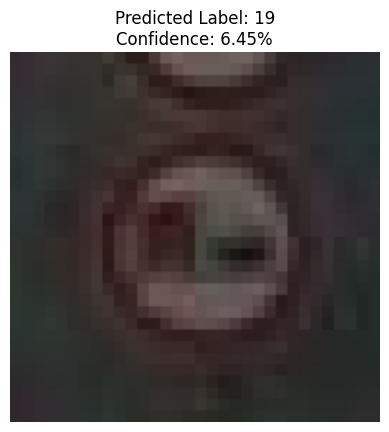

In [35]:
import tensorflow as tf
import tf2onnx
import onnxruntime
import time
import os

def get_file_size(file_path):
    return os.path.getsize(file_path) / (1024 * 1024)  # Convert bytes to MB

def compare_models(saved_model_path, image_path):
    # Load the saved TensorFlow model (SavedModel format)
    tf_model = tf.keras.models.load_model(saved_model_path)

    # Convert the TensorFlow model to TensorFlow Lite format
    tflite_model = tf.keras.models.load_model(saved_model_path)
    converter = tf.lite.TFLiteConverter.from_keras_model(tflite_model)
    tflite_model = converter.convert()

    # Convert the TensorFlow model to ONNX format
    onnx_model, _ = tf2onnx.convert.from_keras(tf_model)

    # Save the TensorFlow Lite model to a file
    tflite_model_path = 'AlexNet.tflite'
    with open(tflite_model_path, 'wb') as f:
        f.write(tflite_model)

    # Save the ONNX model to a file
    onnx_model_path = 'AlexNet.onnx'
    with open(onnx_model_path, 'wb') as f:
        f.write(onnx_model.SerializeToString())

    # Get model file sizes
    file_size = "/content/models/AlexNet/variables/variables.data-00000-of-00001"
    tf_model_size = get_file_size(file_size)
    tflite_model_size = get_file_size(tflite_model_path)
    onnx_model_size = get_file_size(onnx_model_path)

    print("Model File Sizes:")
    print("TensorFlow Model Size:", tf_model_size, "MB")
    print("TensorFlow Lite Model Size:", tflite_model_size, "MB")
    print("ONNX Model Size:", onnx_model_size, "MB")
    print("<<<<<<<<<<<=========================================>>>>>>>>>>>")
    # Load and preprocess the single image
    input_shape = tf_model.input_shape[1:3]  # Adjust for your model's input shape
    image = tf.keras.preprocessing.image.load_img(image_path, target_size=input_shape)
    image_array = tf.keras.preprocessing.image.img_to_array(image)
    image_array = np.expand_dims(image_array, axis=0)

    # TensorFlow inference
    tf_start_time = time.time()
    tf_output = tf_model.predict(image_array)
    tf_end_time = time.time()
    tf_inference_time = tf_end_time - tf_start_time

    # TensorFlow Lite inference
    interpreter = tf.lite.Interpreter(model_content=tflite_model)
    interpreter.allocate_tensors()
    tflite_start_time = time.time()
    interpreter.set_tensor(interpreter.get_input_details()[0]['index'], image_array)
    interpreter.invoke()
    tflite_output = interpreter.get_tensor(interpreter.get_output_details()[0]['index'])
    tflite_end_time = time.time()
    tflite_inference_time = tflite_end_time - tflite_start_time

    # ONNX inference
    onnx_session = onnxruntime.InferenceSession(onnx_model_path)
    input_name = onnx_session.get_inputs()[0].name
    onnx_start_time = time.time()
    onnx_output = onnx_session.run(None, {input_name: image_array})
    onnx_end_time = time.time()
    onnx_inference_time = onnx_end_time - onnx_start_time

    print("Inference Times:")
    print("TensorFlow Inference Time:", tf_inference_time, "seconds")
    print("TensorFlow Lite Inference Time:", tflite_inference_time, "seconds")
    print("ONNX Inference Time:", onnx_inference_time, "seconds")
    print("<<<<<<<<<<<=========================================>>>>>>>>>>>")
    # Compare predictions
    class_names = ['0','1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18','19']  # Replace with your class names
    tf_predicted_label = np.argmax(tf_output[0])
    tflite_predicted_label = np.argmax(tflite_output[0])
    onnx_predicted_label = np.argmax(onnx_output[0])
    print("<<<<<<<<<<<=========================================>>>>>>>>>>>")
    print("Predicted Label and Confidence:")
    print("TensorFlow:", class_names[tf_predicted_label], " (Confidence: {:.2f}%)".format(tf_output[0][tf_predicted_label] * 100))
    print("TensorFlow Lite:", class_names[tflite_predicted_label], " (Confidence: {:.2f}%)".format(tflite_output[0][tflite_predicted_label] * 100))
    print("ONNX:", class_names[onnx_predicted_label], " (Confidence: {:.2f}%)".format(onnx_output[0][0][onnx_predicted_label] * 100))

    # Display the image with the predicted label and confidence
    import matplotlib.pyplot as plt

    plt.imshow(image)
    plt.title("Predicted Label: {}\nConfidence: {:.2f}%".format(class_names[tf_predicted_label], tf_output[0][tf_predicted_label] * 100))
    plt.axis('off')
    plt.show()

    # Clean up: Delete temporary ONNX and TensorFlow Lite model files
    #os.remove(tflite_model_path)
    #os.remove(onnx_model_path)

# Example usage with a single image
saved_model_path = '/content/models/AlexNet'
image_path = '/content/traffic/myData/10/00000_00000.jpg'

compare_models(saved_model_path, image_path)

**Apply Basic FastAPI Technique:**

In [36]:
!pip install fastapi
!pip install uvicorn
!pip install python-multipart
!pip install pyngrok

In [ ]:
from fastapi import FastAPI, File, UploadFile
from fastapi.middleware.cors import CORSMiddleware
import uvicorn
from pyngrok import ngrok
import numpy as np
from io import BytesIO
from PIL import Image
import tensorflow as tf

app = FastAPI()

origins = [
    "http://localhost",
    "http://localhost:8000",
]
app.add_middleware(
    CORSMiddleware,
    allow_origins=origins,
    allow_credentials=True,
    allow_methods=["*"],
    allow_headers=["*"],
)

MODEL = tf.keras.models.load_model("/content/models/AlexNet")

CLASS_NAMES = ['0','1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18','19']

@app.get("/ping")
async def ping():
    return "Hello, I am alive"

def read_file_as_image(data) -> np.ndarray:
    image = np.array(Image.open(BytesIO(data)))
    return image

@app.post("/predict")
async def predict(
    file: UploadFile = File(...)
):
    image = read_file_as_image(await file.read())
    img_batch = np.expand_dims(image, 0)

    predictions = MODEL.predict(img_batch)

    predicted_class = CLASS_NAMES[np.argmax(predictions[0])]
    confidence = np.max(predictions[0])
    return {
        'class': predicted_class,
        'confidence': float(confidence)
    }

if __name__ == "__main__":
    uvicorn.run(app, host='localhost', port=8000)


# Expose the FastAPI app using ngrok
public_url = ngrok.connect(port=8000)
print("Public URL:", public_url)

# Use Ctrl+C to stop the ngrok tunnel when you're done

**MLOps: Apply Basic MLFlow Technique for model tracking:**

In [45]:
!pip install mlflow
!pip install pyngrok

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 53.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.5/83.5 kB 6.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.5/188.5 kB 19.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 225.3/225.3 kB 22.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 148.1/148.1 kB 16.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.1/143.1 kB 16.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.1 MB/s eta 0:00:00
  Created wheel for databricks-cli: filename=databricks_cli-0.17.7-py3-none-any.whl size=143856 sha256=1a558594999471525769187dbbefbfb0df010c25c28a8178b0faaff09cfe0ddb
  Stored in directory: /root/.cache/pip/wheels/ae/63/93/5402c1a09c

In [ ]:
import mlflow
from mlflow import log_metric, log_param, log_artifacts
from pyngrok import ngrok

# Log parameters to MLflow
mlflow.start_run()
log_param("input_shape", input_shape)
log_param("optimizer", "Adam")
log_param("loss_function", "categorical_crossentropy")
log_metric("final_train_accuracy", alexNet_history.history['accuracy'][-1])
log_metric("final_val_accuracy", alexNet_history.history['val_accuracy'][-1])
log_artifacts("/content/models/AlexNet")

# Start ngrok to create a tunnel to the MLflow UI
get_ipython().system_raw("mlflow ui --port 8000 &")
get_ipython().system_raw("./ngrok http 8000 &")

# Get the public URL for the MLflow UI using ngrok
import time
time.sleep(2)  # Give ngrok time to start

from urllib.parse import urlparse
from urllib.request import urlopen
import json

# Fetch ngrok public URL
ngrok_url = !curl -s http://localhost:4040/api/tunnels | python3 -c "import sys, json; print(json.load(sys.stdin)['tunnels'][0]['public_url'])"

# Parse the URL and get the ngrok domain
parsed_url = urlparse(ngrok_url[0])
ngrok_domain = parsed_url.netloc

# Construct the full MLflow UI URL
mlflow_ui_url = f"http://{ngrok_domain}:8000"

print("MLflow UI URL:", mlflow_ui_url)


In [ ]:
mlflow.end_run()

**Zip and Download Model File**

In [ ]:
!zip -r models.zip models/

In [ ]:
from google.colab import files
files.download('models.zip')